# Imports

In [18]:
import matplotlib.pyplot as plt
import pandas as pd 
import numpy as np
from sklearn.impute import SimpleImputer

# Goal
My goal is to visualize various aspects of the COVID-19 pandemic since it started. Particulary looking at it from a country level lens, and anlyzing the cases and the rates of mortality and recovery.

# Data Sources
- [Novel Corona Virus 2019 Dataset](https://www.kaggle.com/datasets/sudalairajkumar/novel-corona-virus-2019-dataset)

# Data Loading

In [19]:
df = pd.read_csv('data/covid_19_data.csv')

# Data Cleaning
- Removing unnecessary columns
- Renaming existing columns
- Restructuring "Date" column
- Replacing empty values

In [20]:
df.drop(['SNo', 'Last Update'], axis = 1, inplace = True)
df.rename(columns = {'ObservationDate':'Date', 'Province/State':'State', 'Country/Region':"Country"}, inplace = True)

In [21]:
df['Date'] = pd.to_datetime(df['Date'])

In [22]:
imputer = SimpleImputer(strategy = 'constant')
df2 = pd.DataFrame(imputer.fit_transform(df), columns = df.columns)

# Cases Over Time
Look at data for the countries, adding up the cases over the course of days after first confirmed case. Producing graph for each confirmed, deaths, and recovered cases.

## Cases Over Time: Countries

In [23]:
df3 = df2.groupby(['Country', 'Date'])[['Confirmed','Deaths','Recovered']].sum().reset_index()

In [24]:
countries = df3['Country'].unique()
len(countries)

229

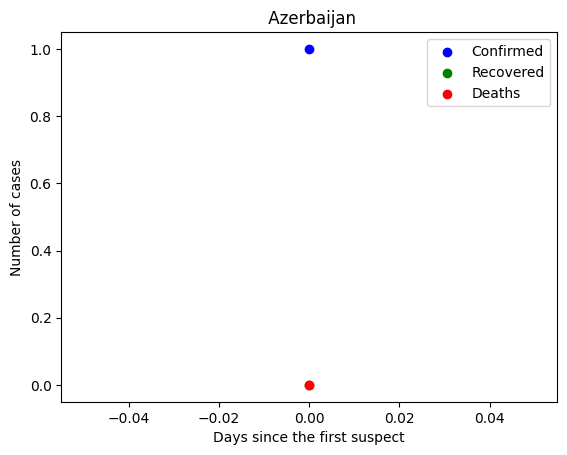

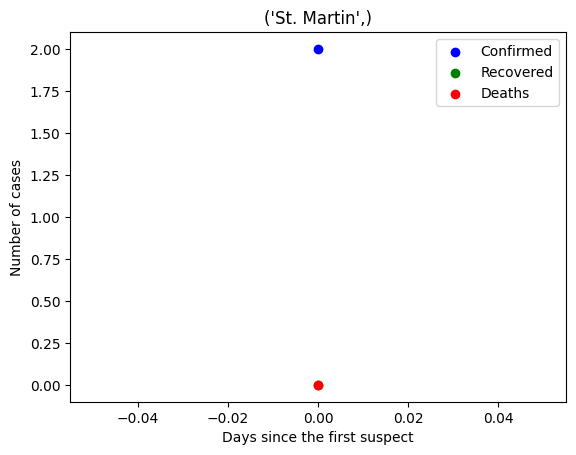

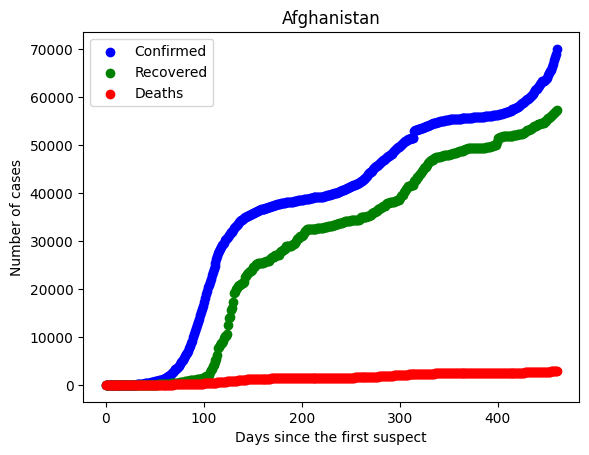

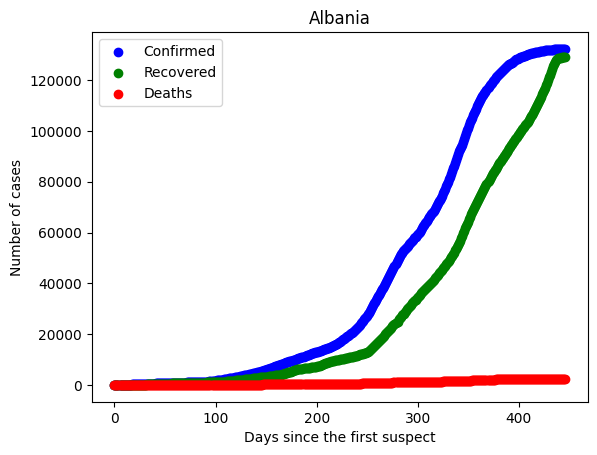

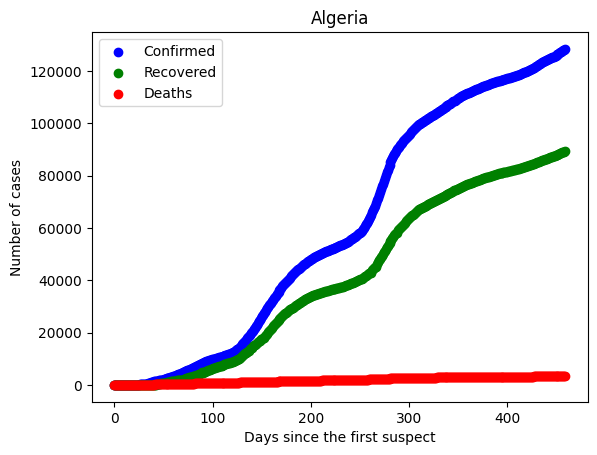

...

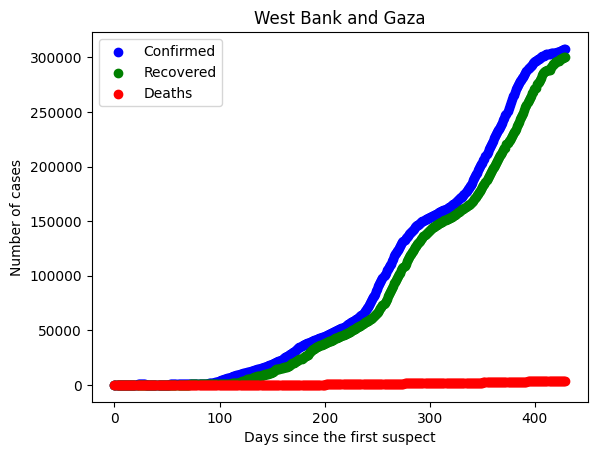

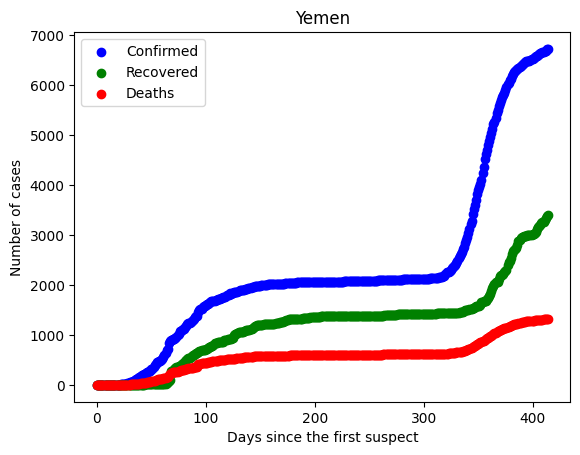

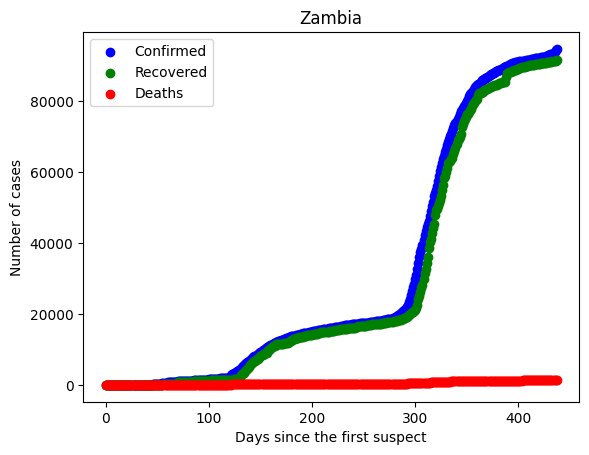

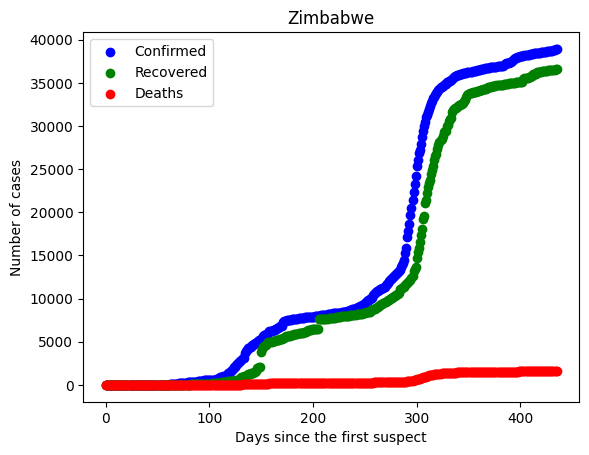

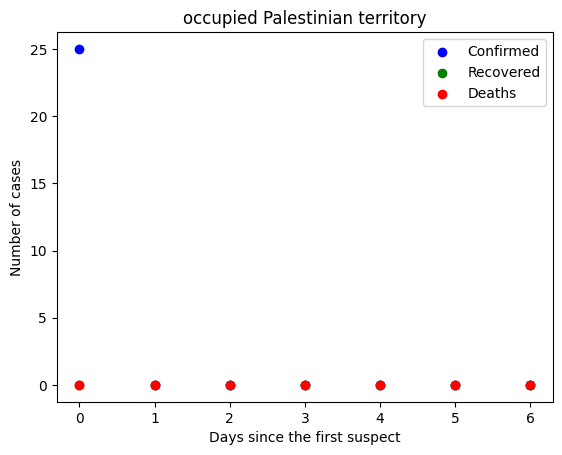

In [25]:
for idx in range(0,len(countries)):    
    C = df3[df3['Country']==countries[idx]].reset_index()        
    plt.scatter(np.arange(0,len(C)),C['Confirmed'],color='blue',label='Confirmed')
    plt.scatter(np.arange(0,len(C)),C['Recovered'],color='green',label='Recovered')
    plt.scatter(np.arange(0,len(C)),C['Deaths'],color='red',label='Deaths')
    plt.title(countries[idx])
    plt.xlabel('Days since the first suspect')
    plt.ylabel('Number of cases')
    plt.legend()
    plt.show()  

## Cases Over Time: World

In [26]:
df4 = df3.groupby(['Date'])[['Confirmed','Deaths','Recovered']].sum().reset_index()

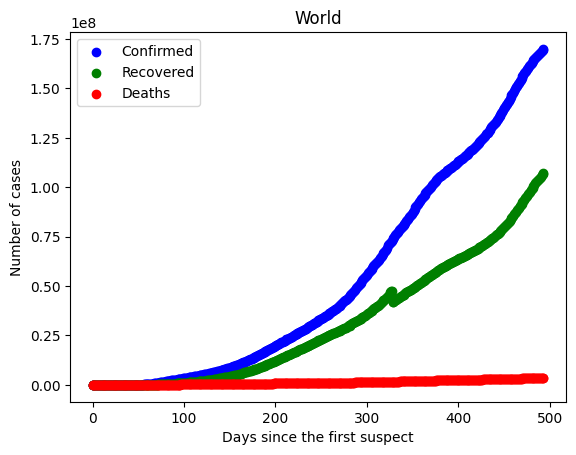

In [27]:
C = df4
plt.scatter(np.arange(0,len(C)),C['Confirmed'],color='blue',label='Confirmed')
plt.scatter(np.arange(0,len(C)),C['Recovered'],color='green',label='Recovered')
plt.scatter(np.arange(0,len(C)),C['Deaths'],color='red',label='Deaths')
plt.title('World')
plt.xlabel('Days since the first suspect')
plt.ylabel('Number of cases')
plt.legend()
plt.show()

# Rates: Recovery Rate and Mortality Rate
Look at the data of recoveries and deaths, to calculate mortality and recovery rates.

In [28]:
df5 = df3.groupby(['Country', 'Date'])[['Confirmed','Deaths','Recovered']].sum().reset_index()

## Calculations
- Recovery Rate = Recovered Cases / Confirmed Cases
- Mortality Rate = Deaths / Confirmed Cases

When no confirmed cases, display a 0% recovery rate and 0% mortality rate.

In [29]:
df5['Recovery Rate'] = df5.apply(lambda x: x['Recovered'] / x['Confirmed'] if x['Confirmed'] > 0 else 0, axis=1)
df5['Mortality Rate'] = df5.apply(lambda x: x['Deaths'] / x['Confirmed'] if x['Confirmed'] > 0 else 0, axis=1)

## Rates: Countries

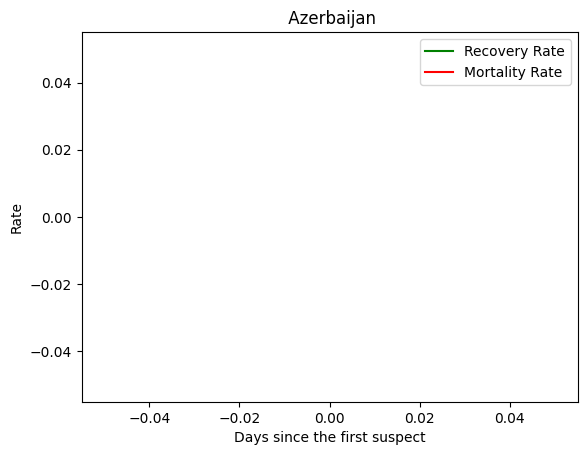

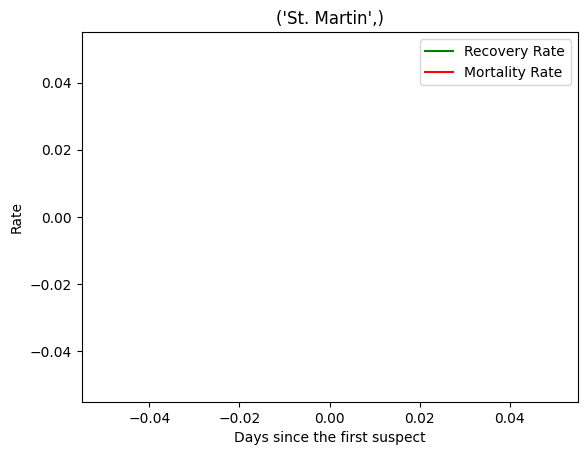

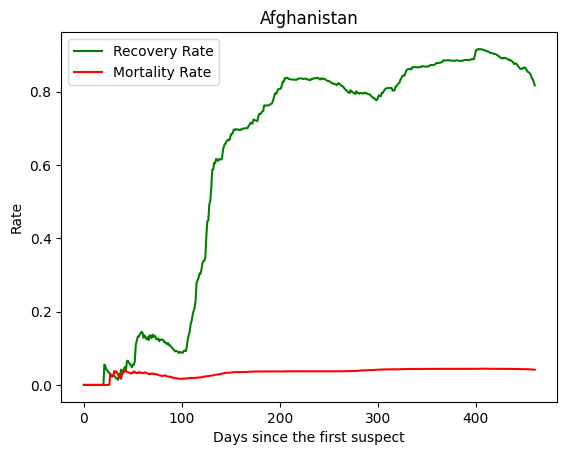

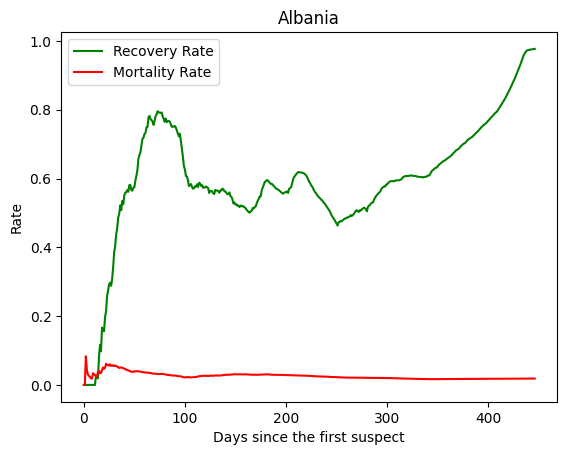

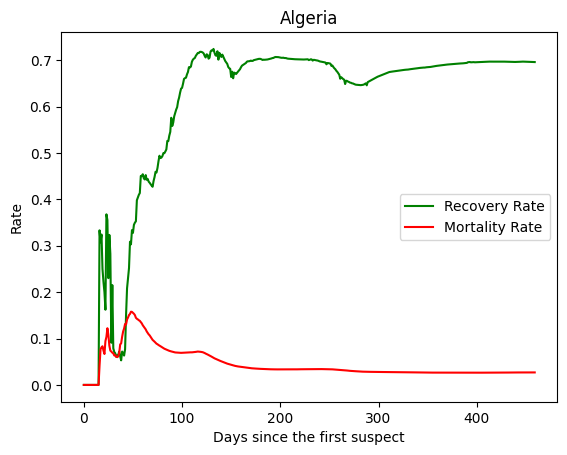

...

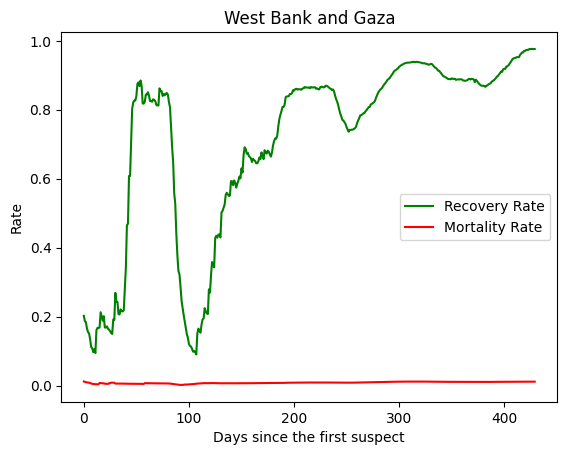

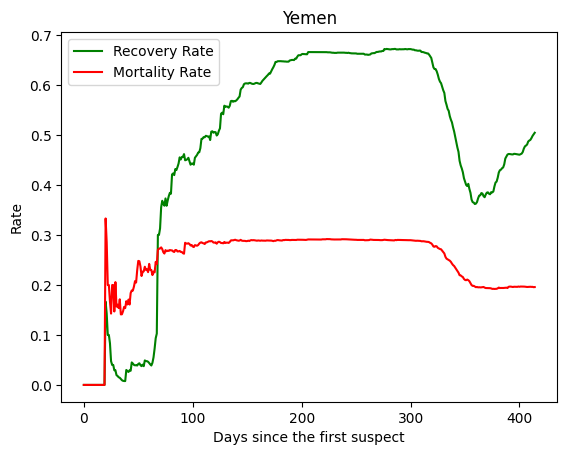

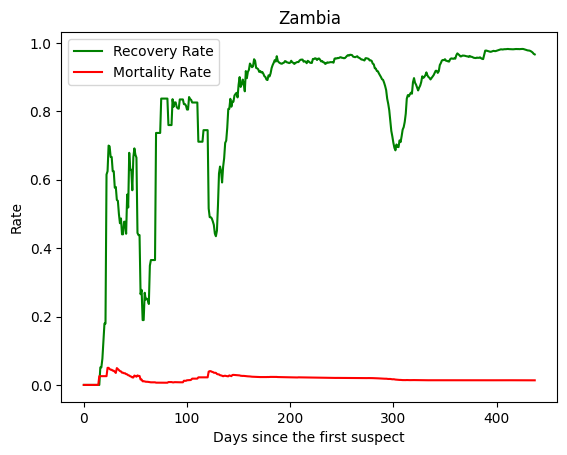

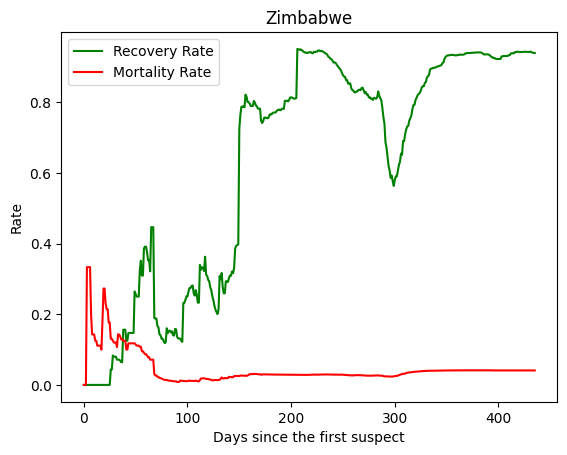

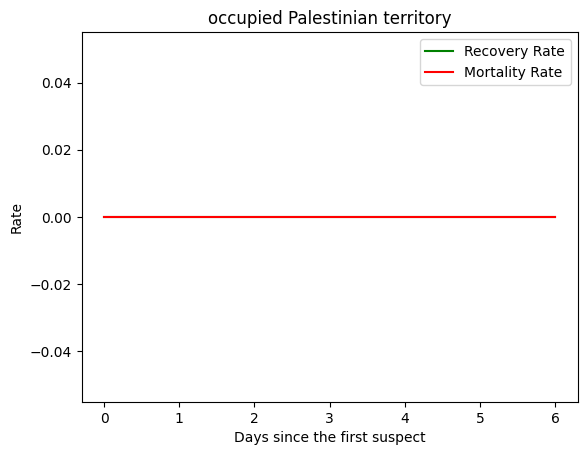

In [30]:
for idx in range(0,len(countries)):    
    C = df5[df5['Country']==countries[idx]].reset_index()        
    plt.plot(np.arange(0,len(C)),C['Recovery Rate'],color='green',label='Recovery Rate')
    plt.plot(np.arange(0,len(C)),C['Mortality Rate'],color='red',label='Mortality Rate')
    plt.title(countries[idx])
    plt.xlabel('Days since the first suspect')
    plt.ylabel('Rate')
    plt.legend()
    plt.show()

## Rates: World

In [31]:
df6 = df5.groupby(['Date'])[['Confirmed','Deaths','Recovered', 'Recovery Rate', 'Mortality Rate']].sum().reset_index()

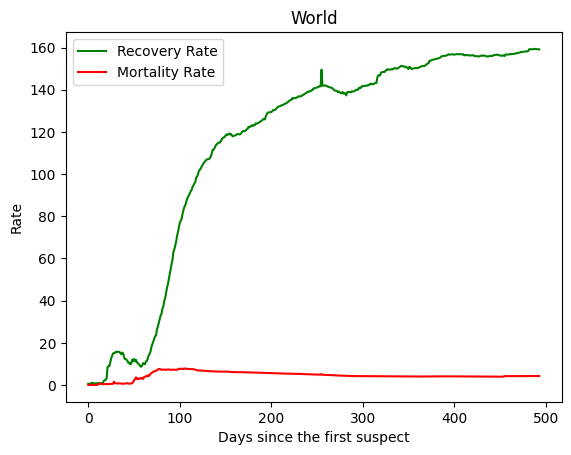

In [32]:
C = df6
plt.plot(np.arange(0,len(C)),C['Recovery Rate'],color='green',label='Recovery Rate')
plt.plot(np.arange(0,len(C)),C['Mortality Rate'],color='red',label='Mortality Rate')
plt.title('World')
plt.xlabel('Days since the first suspect')
plt.ylabel('Rate')
plt.legend()
plt.show()